In [1]:
# initialize
%matplotlib inline

from nilearn import plotting
from nilearn import image

In [31]:
# specify file path
subjects = ['sub001','sub002', 'sub003']
checking_subject = subjects[3]
origin_func_files = '../tasks/flanker_task/data/{}/run001.nii'.format(checking_subject)

struct_filepath = '../tasks/flanker_task/data/{}/struct.nii'.format(checking_subject)

# out from FuNP
registered_file = '../tasks/flanker_task/output/FuNP/{}/registered_file/struct_resample_brain.nii'.format(checking_subject)
normalized_files = '../tasks/flanker_task/output/FuNP/{}/before_smooth/wvol0000_bet_merged.nii'.format(checking_subject)
smoothed_files = '../tasks/flanker_task/output/FuNP/{}/final_out/swvol0000_bet_merged.nii'.format(checking_subject)

IndexError: list index out of range

c:\users\yunfeiluo\appdata\local\programs\python\python36\lib\site-packages\nilearn\image\resampling.py:513: UserWarning: Casting data from int32 to float32
  warnings.warn("Casting data from %s to %s" % (data.dtype.name, aux))



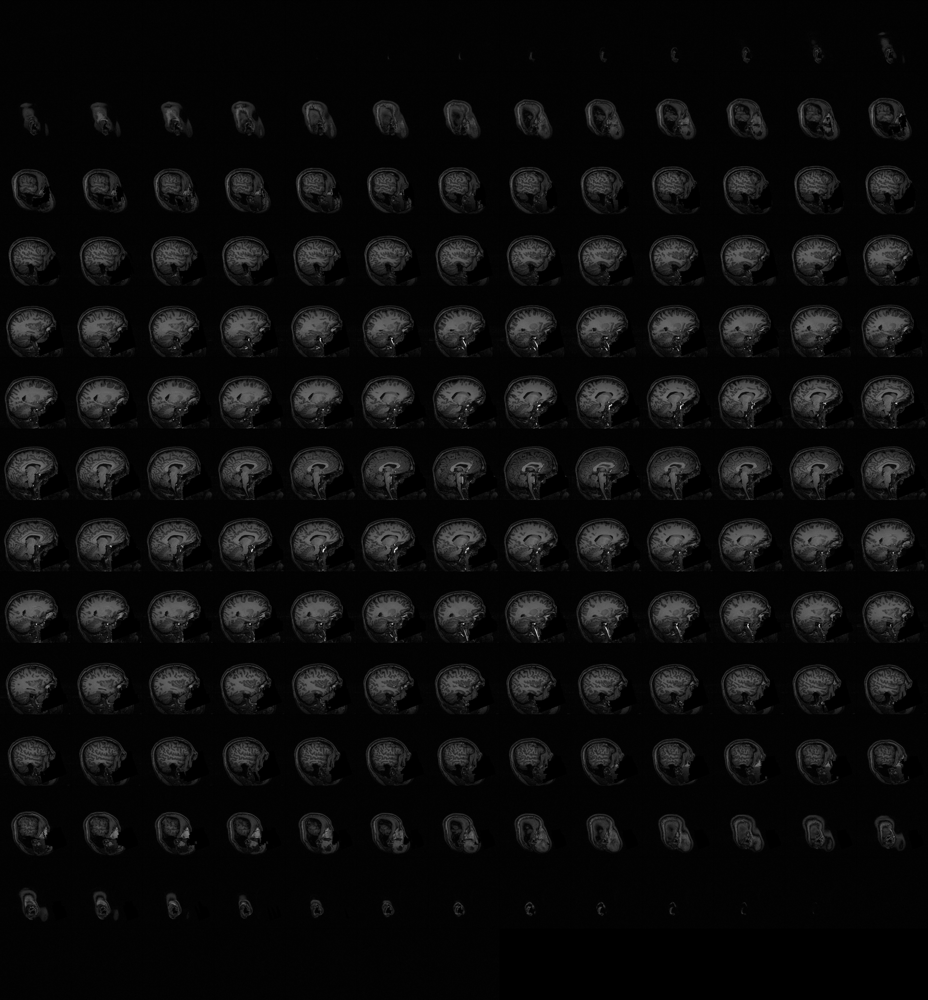
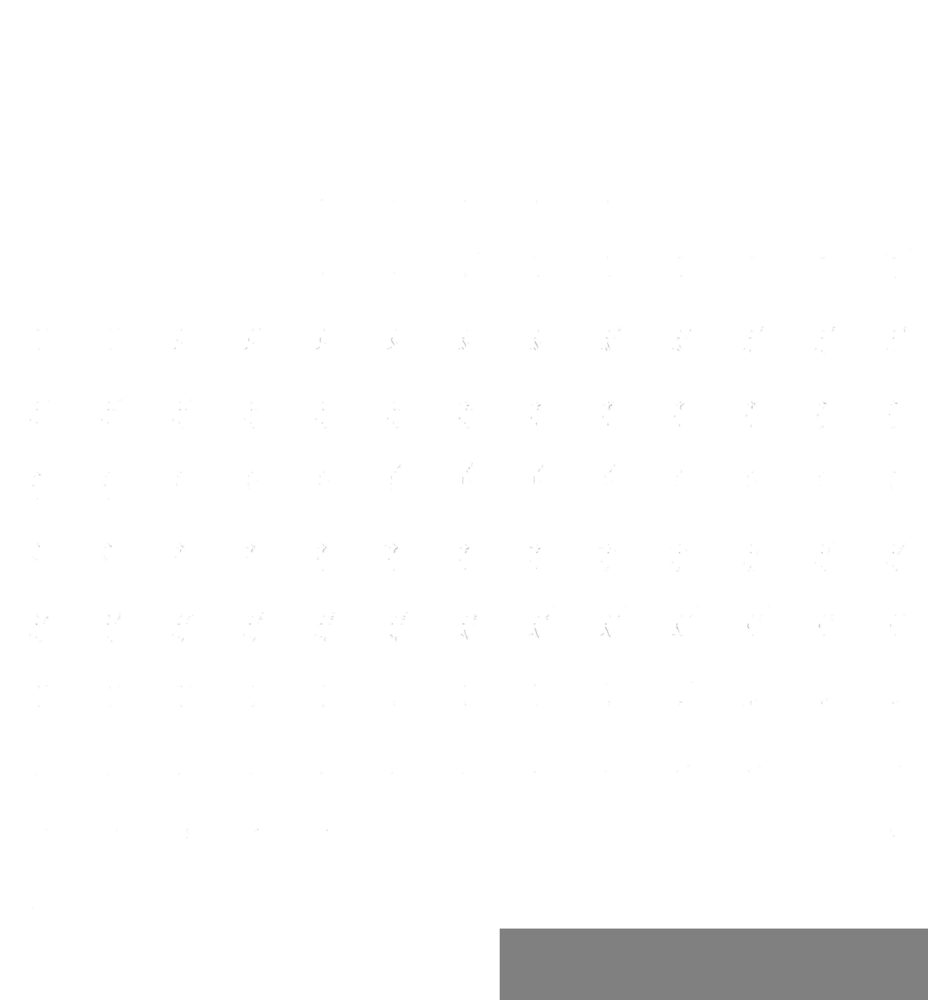

In [32]:
# plot original struct image
original = plotting.view_img(stat_map_img=struct_filepath, 
                             bg_img=struct_filepath, 
                             dim=-0.8, 
                             threshold=512, 
                             title='original_struct_{}'.format(checking_subject), 
                             cmap='gray')
original

c:\users\yunfeiluo\appdata\local\programs\python\python36\lib\site-packages\nilearn\reporting\html_document.py:60: UserWarning: It seems you have created more than 10 nilearn views. As each view uses dozens of megabytes of RAM, you might want to delete some of them.
  MAX_IMG_VIEWS_BEFORE_WARNING))



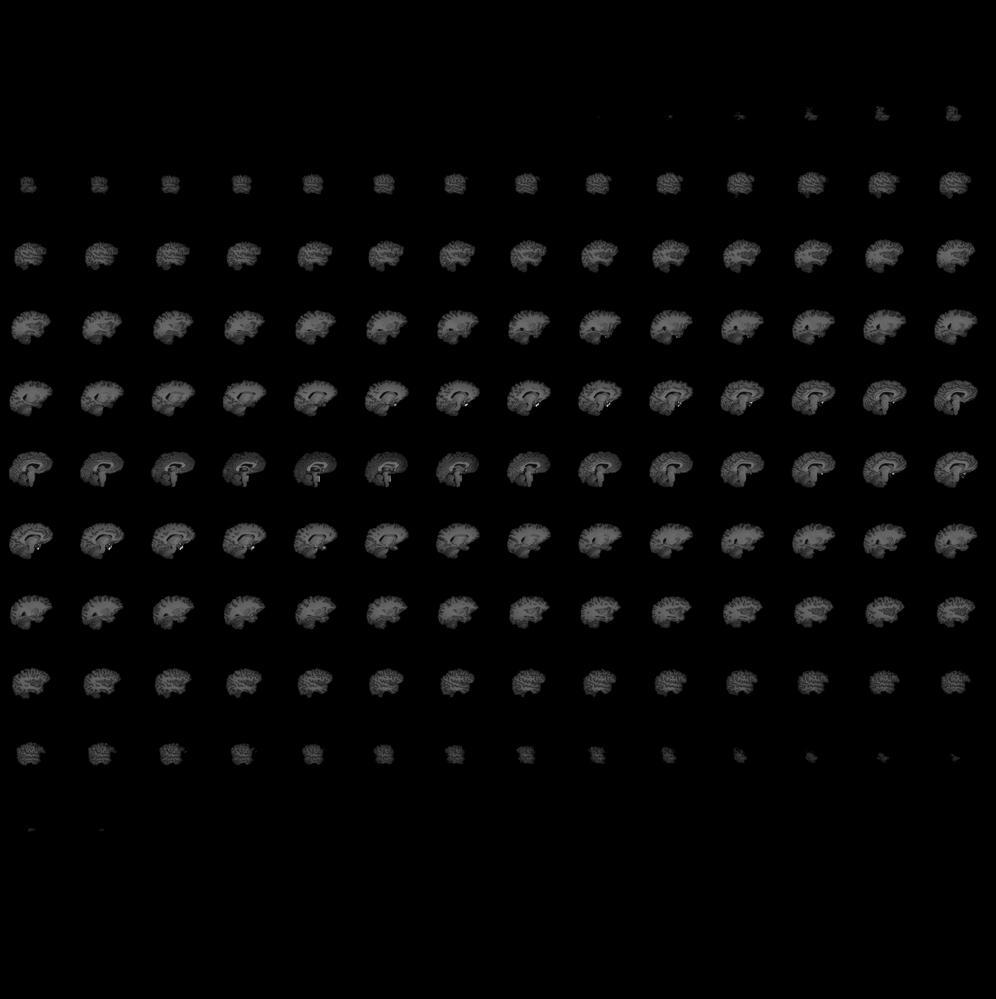
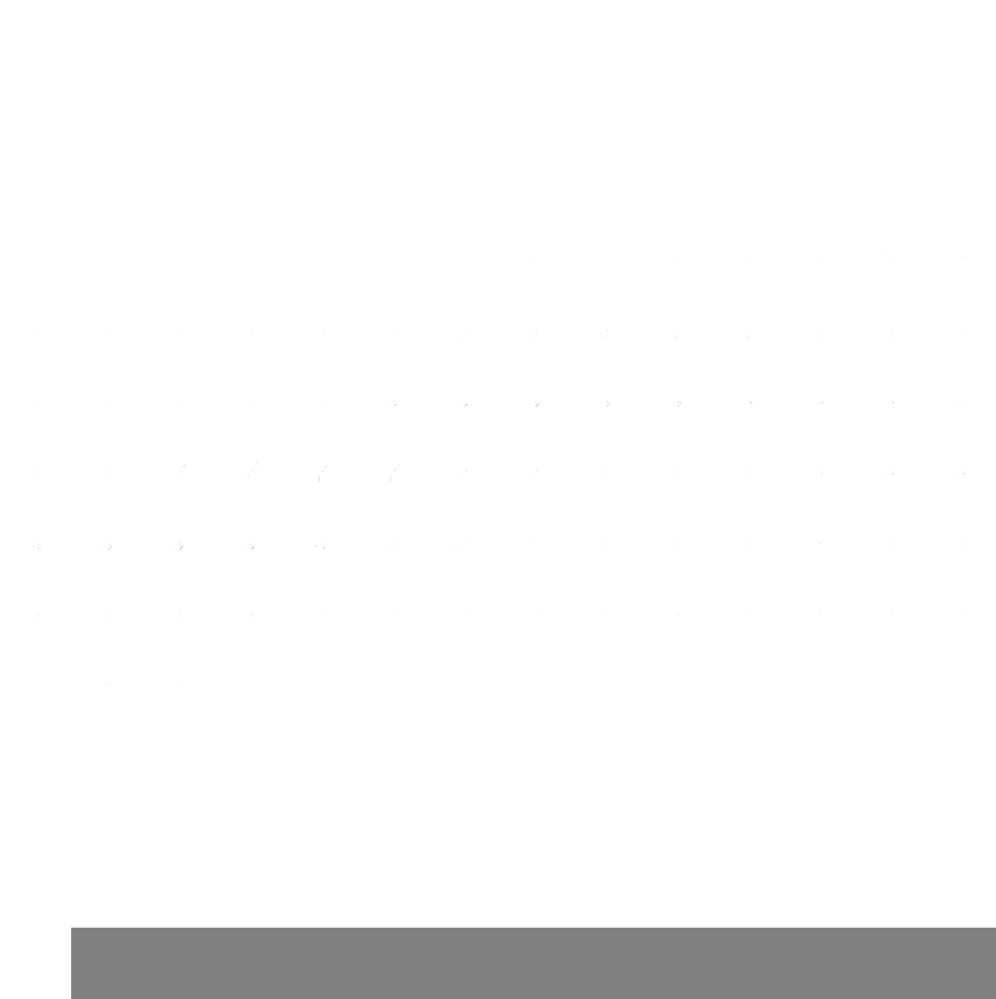

In [33]:
# plot registered image
registered = plotting.view_img(stat_map_img=registered_file, 
                               bg_img=registered_file, 
                               dim=-0.8, 
                               threshold=512, 
                               title='registered_struct_{}'.format(checking_subject), 
                               cmap='gray')
registered

In [34]:
# plot functional MRI
shape = image.load_img(origin_func_files).shape
print('num of time steps', shape[-1])

# specify time steps to look at
#time_steps = [i for i in range(shape[-1])]
time_steps = [50]

from matplotlib.animation import FuncAnimation

def visualize_func(time_steps, files, title):
    for step in time_steps:
        img = image.index_img(files, step)

        plotting.plot_img(img, title=title, cmap='gray')

num of time steps 146


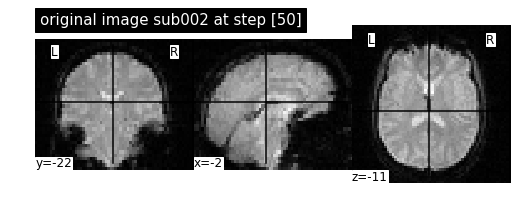

In [35]:
# plot result from FuNP
# origin
visualize_func(time_steps, origin_func_files, 'original image {} at step {}'.format(checking_subject, time_steps))

plotting.show()

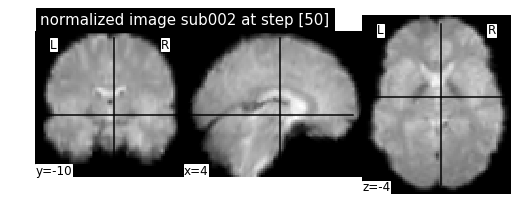

In [36]:
# before smooth
visualize_func(time_steps, normalized_files, 'normalized image {} at step {}'.format(checking_subject, time_steps))
plotting.show()

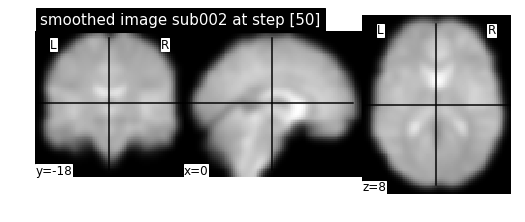

In [37]:
# final output
visualize_func(time_steps, smoothed_files, 'smoothed image {} at step {}'.format(checking_subject, time_steps))
plotting.show()

In [38]:
# checking
import nibabel as nib

img = nib.load(normalized_files)
img1 = nib.load(smoothed_files)
print('before smooth', img.shape)
print('after smooth', img1.shape)

before smooth (79, 95, 78, 146)
after smooth (79, 95, 78, 146)
